In [1]:
from keras import backend as K
print(K.backend())

tensorflow


In [2]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  2


In [3]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 18348885515694302517
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 10089332736
locality {
  bus_id: 1
  links {
  }
}
incarnation: 5079494443658969436
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 3060, pci bus id: 0000:01:00.0, compute capability: 8.6"
xla_global_id: 416903419
, name: "/device:GPU:1"
device_type: "GPU"
memory_limit: 10089332736
locality {
  bus_id: 1
  links {
  }
}
incarnation: 11308802268605468893
physical_device_desc: "device: 1, name: NVIDIA GeForce RTX 3060, pci bus id: 0000:07:00.0, compute capability: 8.6"
xla_global_id: 2144165316
]


In [4]:
!nvidia-smi

Sun Jun  9 23:32:31 2024       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 512.59       Driver Version: 512.59       CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ... WDDM  | 00000000:01:00.0  On |                  N/A |
| 54%   53C    P2    48W / 170W |   3111MiB / 12288MiB |      1%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  NVIDIA GeForce ... WDDM  | 00000000:07:00.0  On |                  N/A |
|  0%   

In [3]:
import math
import pandas as pd
import os
from os import path
from tqdm import tqdm
import json
import cv2
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import datetime
import time
import random
from PIL import Image
import pickle
import joblib
import re

from sklearn import preprocessing
import tensorflow as tf
from keras.layers import Input,Dense,LSTM,Flatten,Dropout,concatenate,Conv1D,MaxPooling2D,Activation
from keras.layers import BatchNormalization
from keras.layers import Embedding
from tensorflow.keras import initializers, regularizers
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
# import keras_tuner
from tensorflow import keras
import tensorflow_hub as hub
import imgaug.augmenters as iaa
from tensorflow.keras.preprocessing import image, text, sequence
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.callbacks import ModelCheckpoint
import numpy as np

import warnings
warnings.filterwarnings("ignore")

In [4]:
import numpy as np
import pickle
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Embedding, LSTM, Dropout, Dense, Concatenate
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import LayerNormalization, MultiHeadAttention
from tensorflow.keras.optimizers.schedules import CosineDecayRestarts

# 初期設定
max_features = 12050  # Maximum vocab size
BATCH_SIZE = 32
MAX_TOKENS = 128
initial_learning_rate = 0.001
total_steps = 10000
warmup_steps = 1000


## 1. Modelling on MSCOCO Dataset

### 1.1 Read Data

In [5]:
colab_path = "./0Data/"

### 1.2 Take sampled 50000 datapoints

In [6]:
data_df_k1000 = pd.read_csv("./0Data/mscoco_train2014_preprocessed_k1000.csv")
data_df_k1000.head(3)

,image_id,question_preprocessed,answer_preprocessed,answers,class_label
0,train2014/COCO_train2014_000000458752.jpg,is this man a professional baseball player,yes,"['yes', 'yes', 'yes', 'yes', 'yes', 'no', 'yes...",995
1,train2014/COCO_train2014_000000524291.jpg,is the dog waiting,yes,"['yes', 'yes', 'yes', 'yes', 'yes', 'yes', 'ye...",995
2,train2014/COCO_train2014_000000393221.jpg,is the sky blue,yes,"['yes', 'yes', 'yes', 'yes', 'yes', 'yes', 'ye...",995


In [7]:
# to get 50k datapoints from dataset with same %count as in dataset

#X = data_df_k1000[['image_id','question_preprocessed','answer_preprocessed','answers','class_label']]
X = data_df_k1000[['image_id','question_preprocessed', 'answer_preprocessed']]
#y = data_df_k1000['class_label']
y = data_df_k1000['answer_preprocessed']
print('X.shape:',X.shape)
print('y.shape:',y.shape)


X.shape: (388272, 3)
y.shape: (388272,)


In [8]:
# perform train validation & test split on the dataset
#X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.10, stratify=y, random_state=42)
#X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.10, stratify=y_train, random_state=42)
# データの分割
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)


#X_train,y_train = pickle.load(open('./0Data/train_1129.pkl', 'rb'))
#X_val,y_val = pickle.load(open('./0Data/val_1129.pkl', 'rb'))
#X_test,y_test = pickle.load(open('./0Data/test_1129.pkl', 'rb'))



print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)
print(X_test.shape, y_test.shape)

# Convert a class vector y_train and y_test to binary class matrix
#Y_train = to_categorical(y_train, 1000)
#Y_val = to_categorical(y_val, 1000)
#Y_test = to_categorical(y_test, 1000)


(310617, 3) (310617,)
(38827, 3) (38827,)
(38828, 3) (38828,)


In [ ]:
#pickle.dump((X_train,y_train),open('./0Data/train_215.pkl','wb'))
#pickle.dump((X_val,y_val),open('./0Data/val_215.pkl','wb'))
#pickle.dump((X_test,y_test),open('./0Data/test_215.pkl','wb'))

In [25]:
# テキストデータを抽出
train_question_examples = X_train['question_preprocessed'].tolist()
train_answer_examples = X_train['answer_preprocessed'].tolist()

max_features = 12050  # Maximum vocab size
BATCH_SIZE = 32
MAX_TOKENS = 128

# TextVectorizationレイヤーの作成と適応
vectorize_layer_question = tf.keras.layers.TextVectorization(
    #standardize="lower_and_strip_punctuation",
    standardize=lambda x: x,
    max_tokens=max_features,
)
#vectorize_layer_question.adapt(train_question_examples, batch_size=None)
vectorize_layer_question.adapt(train_question_examples)

vectorize_layer_answer = tf.keras.layers.TextVectorization(
    #standardize="lower_and_strip_punctuation",
    standardize=lambda x: x,
    max_tokens=max_features,
)
#vectorize_layer_answer.adapt(train_answer_examples, batch_size=None)
vectorize_layer_answer.adapt(train_answer_examples)

In [26]:
# テキストデータの数値化とデータの表示例
for question, answer in zip(train_question_examples[:3], train_answer_examples[:3]):
    print(f"Question: {question}")
    print(f"Vectorized Question: {vectorize_layer_question([question])}")

    print(f"Answer: {answer}")
    print(f"Vectorized Answer: {vectorize_layer_answer([answer])}")

Question: what is in the field behind the bike
Vectorized Question: [[  4   3   7   2 341 116   2 156]]
Answer: flowers
Vectorized Answer: [[94]]
Question: where is the fork
Vectorized Question: [[ 27   3   2 517]]
Answer: plate
Vectorized Answer: [[101]]
Question: is the laptop on
Vectorized Question: [[  3   2 209  10]]
Answer: yes
Vectorized Answer: [[2]]


In [29]:
print(vectorize_layer_answer("yes"))

tf.Tensor([2], shape=(1,), dtype=int64)


In [9]:
# トークン化
t = Tokenizer(filters='')
t.fit_on_texts(list(X_train['question_preprocessed']))
vocab_size = len(t.word_index) + 1

# トークナイザの保存
with open('./0Data/tokenizer1.pkl', 'wb') as handle:
    pickle.dump(t, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [10]:
# トレーニングデータのトークン化とパディング
train_sequences = t.texts_to_sequences(list(X_train['question_preprocessed']))
train_padded_docs = pad_sequences(train_sequences, maxlen=22, padding='post')

val_sequences = t.texts_to_sequences(list(X_val['question_preprocessed']))
val_padded_docs = pad_sequences(val_sequences, maxlen=22, padding='post')

test_sequences = t.texts_to_sequences(list(X_test['question_preprocessed']))
test_padded_docs = pad_sequences(test_sequences, maxlen=22, padding='post')

### 1.3 Text Vectorization

In [11]:
# GloVeベクトルの読み込み
with open('./0Data/glove_vectors/glove.840B.300d.pkl', 'rb') as f:
    glovevector = pickle.load(f)

# エンベディング行列の作成
embedding_matrix = np.zeros((vocab_size, 300))
for word, i in t.word_index.items():
    embedding_vector = glovevector.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

print(embedding_matrix.shape)  # (vocab_size, 300)

(12015, 300)


### 1.4 Data Generator Function

In [12]:
data_path = "./0Data/MSCOCO/"

In [13]:
# 画像データのジェネレータ
datagen = ImageDataGenerator(rescale=1.0/255.0)

train_image_generator = datagen.flow_from_dataframe(
    dataframe=X_train,
    directory='./0Data/MSCOCO/',  # 画像のディレクトリパス
    x_col='image_id',
    y_col='question_preprocessed',
    target_size=(224, 224),  # 画像サイズを指定
    batch_size=BATCH_SIZE,
    class_mode=None  # ラベルを提供しない
)

val_image_generator = datagen.flow_from_dataframe(
    dataframe=X_val,
    directory='./0Data/MSCOCO/',
    x_col='image_id',
    y_col='question_preprocessed',
    target_size=(224, 224),  # 画像サイズを指定
    batch_size=BATCH_SIZE,
    class_mode=None  # ラベルを提供しない
)


Found 310617 validated image filenames.
Found 38827 validated image filenames.


In [22]:
# データパイプラインの構築
def create_data_pipeline(X, y, image_generator, batch_size):
    text_dataset = tf.data.Dataset.from_tensor_slices((pad_sequences(t.texts_to_sequences(X['question_preprocessed']), maxlen=22, padding='post'), y))
    image_dataset = tf.data.Dataset.from_generator(
        lambda: image_generator,
        output_types=(tf.float32),
        #output_shapes=((batch_size, 224, 224, 3))
        output_shapes=((224, 224,3))
    )
    image_dataset = image_dataset.map(lambda img: (img, ))

    dataset = tf.data.Dataset.zip((text_dataset, image_dataset))
    dataset = dataset.map(lambda text, img: ((text[0], img[0]), text[1]))
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)
    
    return dataset

In [33]:
# データパイプラインの構築
def create_data_pipeline(X, y, image_generator, tokenizer, batch_size):
    text_dataset = tf.data.Dataset.from_tensor_slices((pad_sequences(tokenizer.texts_to_sequences(X['question_preprocessed']), maxlen=22, padding='post'), y))
    image_dataset = tf.data.Dataset.from_generator(
        lambda: image_generator,
        output_types=(tf.float32),
        output_shapes=((batch_size, 224, 224, 3))
    )
    image_dataset = image_dataset.map(lambda img: (img, ))

    dataset = tf.data.Dataset.zip((text_dataset, image_dataset))
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)
    
    return dataset

train_dataset = create_data_pipeline(X_train, y_train, train_image_generator, t, BATCH_SIZE)
val_dataset = create_data_pipeline(X_val, y_val, val_image_generator, t, BATCH_SIZE)

In [34]:
print(iter(train_dataset).next())

((<tf.Tensor: shape=(32, 22), dtype=int32, numpy=
array([[   3,    2,    6,    1,  339,  115,    1,  155,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0],
       [  26,    2,    1,  516,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0],
       [   2,    1,  208,    9,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0],
       [   2,   50,   53,  662,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0],
       [   2,   13,  101,  337,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0],
       [   3,    2,    9,    1,   61,  268,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0],
       [   8,   10,  142,    4,  652,    9,    1,  118, 

In [23]:
train_dataset = create_data_pipeline(X_train, y_train, train_image_generator, BATCH_SIZE)
val_dataset = create_data_pipeline(X_val, y_val, val_image_generator, BATCH_SIZE)

### 1.5 Create features for Image Test Data

In [ ]:
# def Dataset(colab_path, que, image_id, y, shape):

#   img = cv2.imread(os.path.join(colab_path,image_id))
#   img = cv2.resize(img,(shape,shape),interpolation=cv2.INTER_NEAREST)
#   img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#   image_vector = (img/255.0).astype(np.float32)

#   que_vector = (pad_sequences(t.texts_to_sequences([que]), maxlen=22, padding='post'))[0]
#   que_vector = np.asarray(que_vector).astype(np.float32)

#   y = tf.one_hot(tf.cast(int(y), tf.uint8), 1000)
#   y = np.asarray(y).astype(np.float32)

#   return que_vector,image_vector,y

# test_image = []; test_que = []; Y_test = []
# for i in tqdm(range(len(X_test))):
#   que, image, y = Dataset(colab_path,list(X_test['question_preprocessed'])[i],list(X_test['image_id'])[i],list(y_test)[i],224)
#   test_image.append(image)
#   test_que.append(que)
#   Y_test.append(y)



100%|██████████| 34945/34945 [10:03<00:00, 57.87it/s]


In [ ]:
# test_image = np.asarray(test_image).astype(np.float32)
# test_que = np.asarray(test_que).astype(np.float32)
# Y_test = np.asarray(Y_test).astype(np.float32)

In [ ]:
# pickle.dump((test_image),open('./0Data/test_image_12.pkl','wb'))
# #test_image= pickle.load(open('./0Data/test_image_0711.pkl', 'rb'))
# test_que = test_padded_docs

### 1.6 Model Metric for Prediction (As per Research Paper)

In [ ]:
# labelencoder = pickle.load(open('./0Data/labelencoder_1.pkl', 'rb'))

# def accuracy_metric(X,Y,encoded_features,model):

#   predicted_Y = model.predict(encoded_features,verbose=0)
#   predicted_class = tf.argmax(predicted_Y, axis=1, output_type=tf.int32)
#   predicted_ans = labelencoder.inverse_transform(predicted_class)

#   acc_val_lst = []
#   for i in tqdm(range(len(Y))):
#     acc_val = 0.0
#     temp = 0

#     for actual_ans in (list(X['answers'])[i]).split(","):
#       #print(actual_ans,predicted_ans[i])
#       if actual_ans == predicted_ans[i]:
#         #print(temp)
#         temp += 1

#     if temp >= 3:
#       acc_val = 1
#     else:
#       acc_val = float(temp)/3

#     acc_val_lst.append(acc_val)
#   return (sum(acc_val_lst)/len(Y))*100

### 1.7 LSTM + Vit Model

In [17]:
# モデルの定義
from transformers import TFViTModel
from tensorflow.keras.layers import Permute, Concatenate
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam

In [18]:
import tensorflow as tf
from tensorflow.keras.layers import Layer, Dense, LayerNormalization, Dropout

class MultiHeadAttention(Layer):
    def __init__(self, d_model, num_heads):
        super(MultiHeadAttention, self).__init__()
        self.num_heads = num_heads
        self.d_model = d_model

        assert d_model % self.num_heads == 0

        self.depth = d_model // self.num_heads

        self.wq = Dense(d_model)
        self.wk = Dense(d_model)
        self.wv = Dense(d_model)

        self.dense = Dense(d_model)

    def split_heads(self, x, batch_size):
        x = tf.reshape(x, (batch_size, -1, self.num_heads, self.depth))
        return tf.transpose(x, perm=[0, 2, 1, 3])

    def call(self, v, k, q, mask):
        batch_size = tf.shape(q)[0]

        q = self.wq(q)
        k = self.wk(k)
        v = self.wv(v)

        q = self.split_heads(q, batch_size)
        k = self.split_heads(k, batch_size)
        v = self.split_heads(v, batch_size)

        scaled_attention, attention_weights = self.scaled_dot_product_attention(q, k, v, mask)
        scaled_attention = tf.transpose(scaled_attention, perm=[0, 2, 1, 3])
        concat_attention = tf.reshape(scaled_attention, (batch_size, -1, self.d_model))
        output = self.dense(concat_attention)

        return output, attention_weights

    def scaled_dot_product_attention(self, q, k, v, mask):
        matmul_qk = tf.matmul(q, k, transpose_b=True)
        dk = tf.cast(tf.shape(k)[-1], tf.float32)
        scaled_attention_logits = matmul_qk / tf.math.sqrt(dk)

        if mask is not None:
            scaled_attention_logits += (mask * -1e9)

        attention_weights = tf.nn.softmax(scaled_attention_logits, axis=-1)
        output = tf.matmul(attention_weights, v)

        return output, attention_weights

class TransformerDecoderLayer(Layer):
    def __init__(self, d_model, num_heads, dff, rate=0.1):
        super(TransformerDecoderLayer, self).__init__()

        self.mha1 = MultiHeadAttention(d_model, num_heads)
        self.mha2 = MultiHeadAttention(d_model, num_heads)

        self.ffn = tf.keras.Sequential([
            Dense(dff, activation='relu'),
            Dense(d_model)
        ])

        self.layernorm1 = LayerNormalization(epsilon=1e-6)
        self.layernorm2 = LayerNormalization(epsilon=1e-6)
        self.layernorm3 = LayerNormalization(epsilon=1e-6)

        self.dropout1 = Dropout(rate)
        self.dropout2 = Dropout(rate)
        self.dropout3 = Dropout(rate)

    def call(self, x, enc_output, training, look_ahead_mask, padding_mask):
        attn1, attn_weights_block1 = self.mha1(x, x, x, look_ahead_mask)
        attn1 = self.dropout1(attn1, training=training)
        out1 = self.layernorm1(attn1 + x)

        attn2, attn_weights_block2 = self.mha2(enc_output, enc_output, out1, padding_mask)
        attn2 = self.dropout2(attn2, training=training)
        out2 = self.layernorm2(attn2 + out1)

        ffn_output = self.ffn(out2)
        ffn_output = self.dropout3(ffn_output, training=training)
        out3 = self.layernorm3(ffn_output + out2)

        return out3, attn_weights_block1, attn_weights_block2

class TransformerDecoder(Layer):
    def __init__(self, num_layers, d_model, num_heads, dff, target_vocab_size, rate=0.1):
        super(TransformerDecoder, self).__init__()

        self.d_model = d_model
        self.num_layers = num_layers

        self.embedding = Embedding(target_vocab_size, d_model)
        self.pos_encoding = self.positional_encoding(10000, self.d_model)

        self.dec_layers = [TransformerDecoderLayer(d_model, num_heads, dff, rate) for _ in range(num_layers)]
        self.dropout = Dropout(rate)

    def positional_encoding(self, position, d_model):
        angle_rads = self.get_angles(np.arange(position)[:, np.newaxis], np.arange(d_model)[np.newaxis, :], d_model)
        angle_rads[:, 0::2] = np.sin(angle_rads[:, 0::2])
        angle_rads[:, 1::2] = np.cos(angle_rads[:, 1::2])
        pos_encoding = angle_rads[np.newaxis, ...]
        return tf.cast(pos_encoding, dtype=tf.float32)

    def get_angles(self, pos, i, d_model):
        angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))
        return pos * angle_rates

    def call(self, x, enc_output, training, look_ahead_mask, padding_mask):
        seq_len = tf.shape(x)[1]
        attention_weights = {}

        x = self.embedding(x)
        x *= tf.math.sqrt(tf.cast(self.d_model, tf.float32))
        x += self.pos_encoding[:, :seq_len, :]
        x = self.dropout(x, training=training)

        for i in range(self.num_layers):
            x, block1, block2 = self.dec_layers[i](x, enc_output, training, look_ahead_mask, padding_mask)
            attention_weights[f'decoder_layer{i+1}_block1'] = block1
            attention_weights[f'decoder_layer{i+1}_block2'] = block2

        return x, attention_weights

In [33]:
# ViTの設定
vit_model = TFViTModel.from_pretrained('google/vit-base-patch16-224-in21k')
for layer in vit_model.layers:
    layer.trainable = False

# ViTの出力を取り出し
input_vit = Input(shape=(224, 224, 3))
x = Permute((3, 1, 2))(input_vit)
vit = vit_model(x)
vit_output = vit.pooler_output
#vit_output = vit_model.output.last_hidden_state[:, 0, :]  # [CLS]トークンの出力を使用

img = Dense(units=1024, activation='relu', kernel_initializer='he_normal')(vit_output)
img = Dropout(0.2)(img)

input_layer_que = Input(shape=(22,))
embedding = Embedding(vocab_size, 300, weights=[embedding_matrix], input_length=22, trainable=False)(input_layer_que)
lstm1 = LSTM(64, return_sequences=True)(embedding)
dropout1 = Dropout(0.5)(lstm1)
lstm2 = LSTM(64)(dropout1)
dropout2 = Dropout(0.5)(lstm2)
que = Dense(units=1024, activation='relu', kernel_initializer='he_normal')(dropout2)

concatenated = Concatenate()([que, img])

num_layers = 6
d_model = 512
dff = 2048
num_heads = 8
dropout_rate = 0.1

# Transformerのデコーダーの定義
decoder = TransformerDecoder(
    num_layers=num_layers,
    d_model=d_model,
    num_heads=num_heads,
    dff=dff,
    target_vocab_size=max_features,
    rate=dropout_rate
)

dec_output, attention_weights = decoder(concatenated, concatenated, training=True, look_ahead_mask=None, padding_mask=None)
first_decay_steps = 1000

scheduler = CosineDecayRestarts(initial_learning_rate, first_decay_steps,total_steps, alpha=0.1)
optimizer = Adam(learning_rate=scheduler)

model_lstm_vit = Model(inputs=[input_layer_que, vit_model.input], outputs=dec_output)
model_lstm_vit.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), optimizer=optimizer, metrics=['accuracy'])

model_lstm_vit.summary()

All model checkpoint layers were used when initializing TFViTModel.

All the layers of TFViTModel were initialized from the model checkpoint at google/vit-base-patch16-224-in21k.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFViTModel for predictions without further training.


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_14 (InputLayer)          [(None, 22)]         0           []                               
                                                                                                  
 embedding_10 (Embedding)       (None, 22, 300)      3604500     ['input_14[0][0]']               
                                                                                                  
 lstm_10 (LSTM)                 (None, 22, 64)       93440       ['embedding_10[1][0]']           
                                                                                                  
 dropout_296 (Dropout)          (None, 22, 64)       0           ['lstm_10[1][0]']                
                                                                                            

In [19]:
# EfficientNet
pre_trained_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(input_shape=(224, 224, 3), include_top=False, weights='imagenet', pooling='avg')
for layer in pre_trained_model.layers:
    layer.trainable = False

regularizer = l2(0.01)
for layer in pre_trained_model.layers:
    for attr in ['kernel_regularizer']:
        if hasattr(layer, attr):
            setattr(layer, attr, regularizer)

efficient_net_output = pre_trained_model.output
img = Dense(units=1024, activation='relu', kernel_initializer='he_normal')(efficient_net_output)
img = Dropout(0.2)(img)

input_layer_que = Input(shape=(22,))
embedding = Embedding(vocab_size, 300, weights=[embedding_matrix], input_length=22, trainable=False)(input_layer_que)
lstm1 = LSTM(64, return_sequences=True)(embedding)
dropout1 = Dropout(0.5)(lstm1)
lstm2 = LSTM(64)(dropout1)
dropout2 = Dropout(0.5)(lstm2)
que = Dense(units=1024, activation='relu', kernel_initializer='he_normal')(dropout2)

concatenated = Concatenate()([que, img])

num_layers = 6
d_model = 512
dff = 2048
num_heads = 8
dropout_rate = 0.1

# Transformerのデコーダーの定義
decoder = TransformerDecoder(
    num_layers=num_layers,
    d_model=d_model,
    num_heads=num_heads,
    dff=dff,
    target_vocab_size=max_features,
    rate=dropout_rate
)

dec_output, attention_weights = decoder(concatenated, concatenated, training=True, look_ahead_mask=None, padding_mask=None)
first_decay_steps = 1000

scheduler = CosineDecayRestarts(initial_learning_rate, first_decay_steps,total_steps, alpha=0.1)
optimizer = Adam(learning_rate=scheduler)

model_lstm_vit = Model(inputs=[input_layer_que, pre_trained_model.input], outputs=dec_output)
model_lstm_vit.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), optimizer=optimizer, metrics=['accuracy'])

model_lstm_vit.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_1[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  0           ['rescaling[0][0]']              
                                                                                                  
 stem_conv (Conv2D)             (None, 112, 112, 32  864         ['normalization[0][0]']      

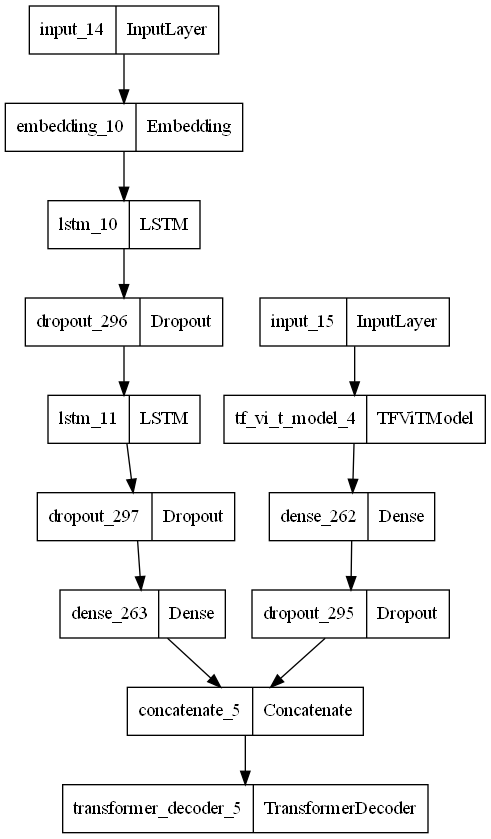

In [36]:
from tensorflow.keras.utils import plot_model
#plot_model(model, to_file='model_vit.png', show_shapes=True)
plot_model(model_lstm_vit, to_file='model_gpt2024_06_09.png', show_layer_names=True)

In [24]:
# モデルのトレーニング
history = model_lstm_vit.fit(
    train_dataset,
    epochs=10,  # 適切なエポック数を指定
    validation_data=val_dataset
)

Epoch 1/10


UnimplementedError: Graph execution error:

Detected at node 'Cast_1' defined at (most recent call last):
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\runpy.py", line 197, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\runpy.py", line 87, in _run_code
      exec(code, run_globals)
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\traitlets\config\application.py", line 992, in launch_instance
      app.start()
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\ipykernel\kernelapp.py", line 712, in start
      self.io_loop.start()
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\tornado\platform\asyncio.py", line 195, in start
      self.asyncio_loop.run_forever()
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\asyncio\base_events.py", line 596, in run_forever
      self._run_once()
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\asyncio\base_events.py", line 1890, in _run_once
      handle._run()
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\asyncio\events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\ipykernel\kernelbase.py", line 510, in dispatch_queue
      await self.process_one()
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\ipykernel\kernelbase.py", line 499, in process_one
      await dispatch(*args)
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\ipykernel\kernelbase.py", line 406, in dispatch_shell
      await result
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\ipykernel\kernelbase.py", line 730, in execute_request
      reply_content = await reply_content
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\ipykernel\ipkernel.py", line 383, in do_execute
      res = shell.run_cell(
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\ipykernel\zmqshell.py", line 528, in run_cell
      return super().run_cell(*args, **kwargs)
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\IPython\core\interactiveshell.py", line 3024, in run_cell
      result = self._run_cell(
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\IPython\core\interactiveshell.py", line 3079, in _run_cell
      result = runner(coro)
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\IPython\core\async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\IPython\core\interactiveshell.py", line 3284, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\IPython\core\interactiveshell.py", line 3466, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\IPython\core\interactiveshell.py", line 3526, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "C:\Users\Lsemi\AppData\Local\Temp\ipykernel_30908\1583075988.py", line 2, in <module>
      history = model_lstm_vit.fit(
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\keras\engine\training.py", line 1564, in fit
      tmp_logs = self.train_function(iterator)
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\keras\engine\training.py", line 1160, in train_function
      return step_function(self, iterator)
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\keras\engine\training.py", line 1146, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\keras\engine\training.py", line 1135, in run_step
      outputs = model.train_step(data)
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\keras\engine\training.py", line 998, in train_step
      return self.compute_metrics(x, y, y_pred, sample_weight)
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\keras\engine\training.py", line 1092, in compute_metrics
      self.compiled_metrics.update_state(y, y_pred, sample_weight)
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\keras\engine\compile_utils.py", line 605, in update_state
      metric_obj.update_state(y_t, y_p, sample_weight=mask)
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\keras\utils\metrics_utils.py", line 77, in decorated
      update_op = update_state_fn(*args, **kwargs)
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\keras\metrics\base_metric.py", line 143, in update_state_fn
      return ag_update_state(*args, **kwargs)
    File "c:\Users\Lsemi\anaconda3\envs\KIBU3\lib\site-packages\keras\metrics\base_metric.py", line 685, in update_state
      y_true = tf.cast(y_true, self._dtype)
Node: 'Cast_1'
Cast string to float is not supported
	 [[{{node Cast_1}}]] [Op:__inference_train_function_25429]

In [36]:
checkpoint_filepath="./0Data/model/trans/lstm_vit_trans_weights-{epoch:02d}-{val_accuracy:.4f}.hdf5"
model_checkpoint_callback = ModelCheckpoint(filepath=checkpoint_filepath, monitor='val_accuracy', verbose=0, save_best_only=True, mode='max')

In [37]:
from keras.callbacks import EarlyStopping

# EarlyStoppingコールバックの設定
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=10, min_delta=0.001)

In [ ]:
#history_lstm_vit = model_lstm_vit.fit(traingen,batch_size=128,epochs=120,verbose=1,validation_data=valgen,callbacks=[model_checkpoint_callback])

In [42]:
!nvidia-smi

Tue Mar 12 12:47:39 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 530.30.02              Driver Version: 530.30.02    CUDA Version: 12.1     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                  Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf            Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-40GB           On | 00000000:01:00.0 Off |                    0 |
| N/A   27C    P0               59W / 400W|  39537MiB / 40960MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [ ]:
#cos+focalloss
# Plot training & validation loss values
plt.figure(figsize=(15, 4)); plt.subplot(121)
plt.plot(history.history['loss']); plt.plot(history.history['val_loss'])
plt.title('Train & Validation loss'); plt.ylabel('loss'); plt.xlabel('Epoch'); plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation Accuracy values
plt.subplot(122)
plt.plot(history.history['accuracy']); plt.plot(history.history['val_accuracy'])
plt.title('Train & Validation accuracy'); plt.ylabel('accuracy'); plt.xlabel('Epoch'); plt.legend(['Train', 'Validation'], loc='upper left')

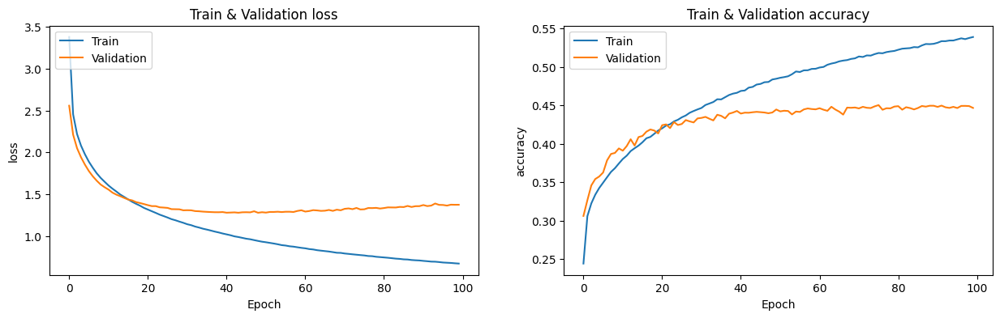

In [ ]:
#cos+focalloss
# Plot training & validation loss values
plt.figure(figsize=(15, 4)); plt.subplot(121)
plt.plot(history_lstm_vit.history['loss']); plt.plot(history_lstm_vit.history['val_loss'])
plt.title('Train & Validation loss'); plt.ylabel('loss'); plt.xlabel('Epoch'); plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation Accuracy values
plt.subplot(122)
plt.plot(history_lstm_vit.history['accuracy']); plt.plot(history_lstm_vit.history['val_accuracy'])
plt.title('Train & Validation accuracy'); plt.ylabel('accuracy'); plt.xlabel('Epoch'); plt.legend(['Train', 'Validation'], loc='upper left')

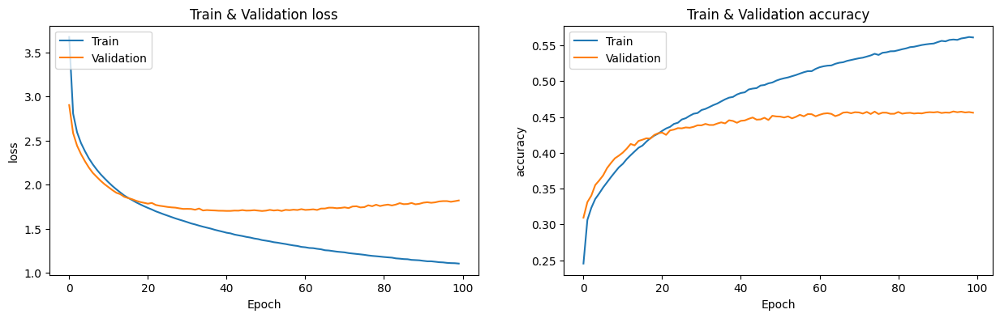

In [ ]:
#cosanilling + categoryloss
# Plot training & validation loss values
plt.figure(figsize=(15, 4)); plt.subplot(121)
plt.plot(history_lstm_vit.history['loss']); plt.plot(history_lstm_vit.history['val_loss'])
plt.title('Train & Validation loss'); plt.ylabel('loss'); plt.xlabel('Epoch'); plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation Accuracy values
plt.subplot(122)
plt.plot(history_lstm_vit.history['accuracy']); plt.plot(history_lstm_vit.history['val_accuracy'])
plt.title('Train & Validation accuracy'); plt.ylabel('accuracy'); plt.xlabel('Epoch'); plt.legend(['Train', 'Validation'], loc='upper left')

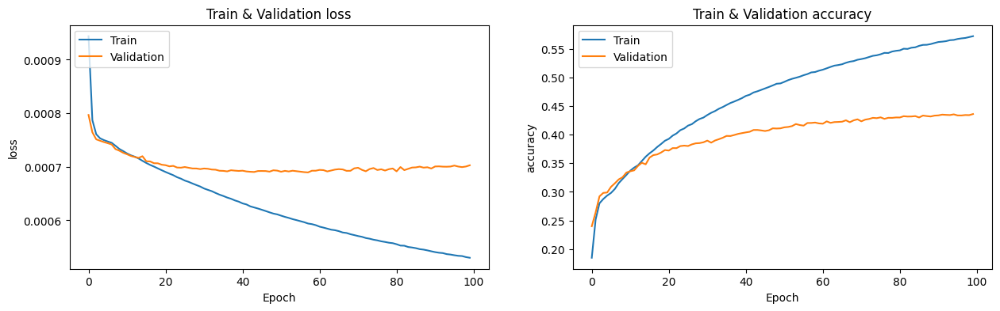

In [ ]:
#MSELoss
# Plot training & validation loss values
plt.figure(figsize=(15, 4)); plt.subplot(121)
plt.plot(history_lstm_vit.history['loss']); plt.plot(history_lstm_vit.history['val_loss'])
plt.title('Train & Validation loss'); plt.ylabel('loss'); plt.xlabel('Epoch'); plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation Accuracy values
plt.subplot(122)
plt.plot(history_lstm_vit.history['accuracy']); plt.plot(history_lstm_vit.history['val_accuracy'])
plt.title('Train & Validation accuracy'); plt.ylabel('accuracy'); plt.xlabel('Epoch'); plt.legend(['Train', 'Validation'], loc='upper left')

In [ ]:
Test_accuracy = accuracy_metric(X_test,Y_test,[test_que,test_image],model_lstm_vit)

2024-01-07 21:35:50.554359: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 21040803840 exceeds 10% of free system memory.
2024-01-07 21:35:58.361884: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 21040803840 exceeds 10% of free system memory.
100%|██████████| 34945/34945 [01:08<00:00, 512.01it/s]


In [ ]:
print("\nTest accuracy of LSTM+Vit Model 50k Datapoints:",Test_accuracy)  # 41.42


Test accuracy of LSTM+Vit Model 50k Datapoints: 0.0


In [ ]:
model_lstm_vit.save('./0Data/model/lstm_vit/model_lstm_vit_cos_trans1.h5')

In [ ]:
# model_lstm_vgg19 = tf.keras.models.load_model('/content/drive/MyDrive/Applied AI/CS2/model/model_2lstm_vgg19_50k_1011_50.h5')

In [ ]:
pickle.dump(model_lstm_vit, open("./0Data/lstm_vit_final_model_cos_trans1.pkl", "wb"))

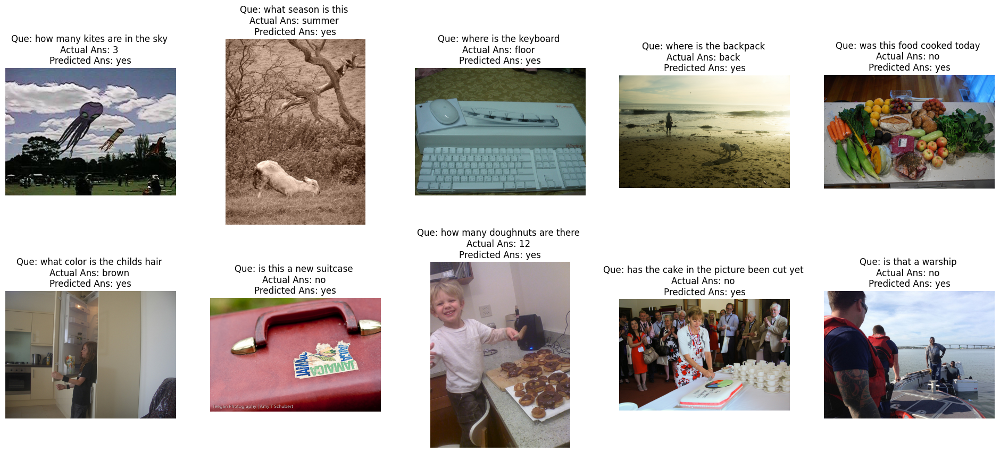

In [ ]:
test_image_path = list(X_test['image_id'])
test_question = list(X_test['question_preprocessed'])
test_answer = list(y_test)

# Plot test images, questions, actual answers and predicted answers
fig = plt.figure(figsize=(24, 10))
for a,i in enumerate(list(np.arange(5,15))):
  fig.add_subplot(2, 5, a+1)
  img = cv2.imread(colab_path+test_image_path[i])
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  plt.imshow(img); plt.axis('off')
  plt.title(f'Que: {test_question[i]} \nActual Ans: {labelencoder.inverse_transform(test_answer)[i]} \nPredicted Ans: {labelencoder.inverse_transform([np.argmax(model_lstm_vit.predict([np.array([test_que[i]]),np.array([test_image[i]])],verbose=0))])[0]}')

Cause: Unable to locate the source code of <function Model.make_predict_function.<locals>.predict_function at 0x000001B03384F670>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: Unable to locate the source code of <function Model.make_predict_function.<locals>.predict_function at 0x000001B03384F670>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: Unable to locate the source code of <function Model.make_predict_function.<locals>.predict_function at 0x000001B03384F670>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


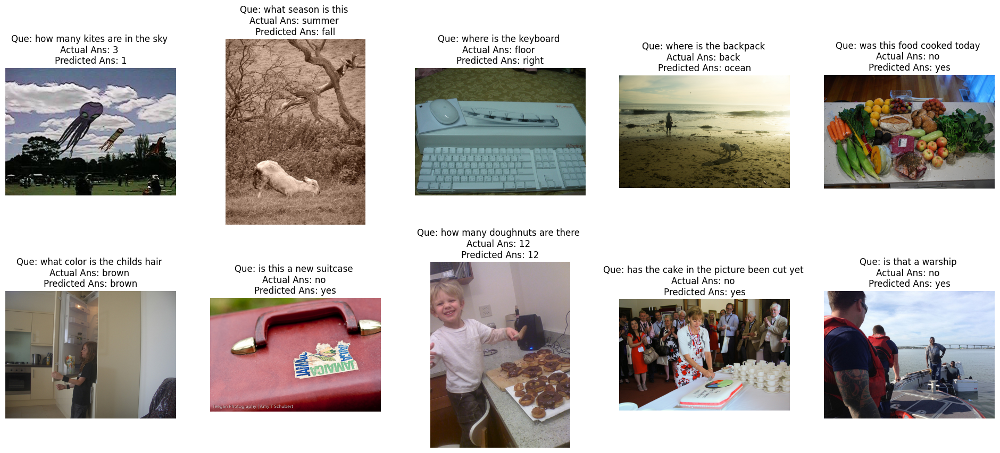

In [ ]:
test_image_path = list(X_test['image_id'])
test_question = list(X_test['question_preprocessed'])
test_answer = list(y_test)

# Plot test images, questions, actual answers and predicted answers
fig = plt.figure(figsize=(24, 10))
for a,i in enumerate(list(np.arange(5,15))):
  fig.add_subplot(2, 5, a+1)
  img = cv2.imread(colab_path+test_image_path[i])
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  plt.imshow(img); plt.axis('off')
  plt.title(f'Que: {test_question[i]} \nActual Ans: {labelencoder.inverse_transform(test_answer)[i]} \nPredicted Ans: {labelencoder.inverse_transform([np.argmax(model_lstm_vit.predict([np.array([test_que[i]]),np.array([test_image[i]])],verbose=0))])[0]}')

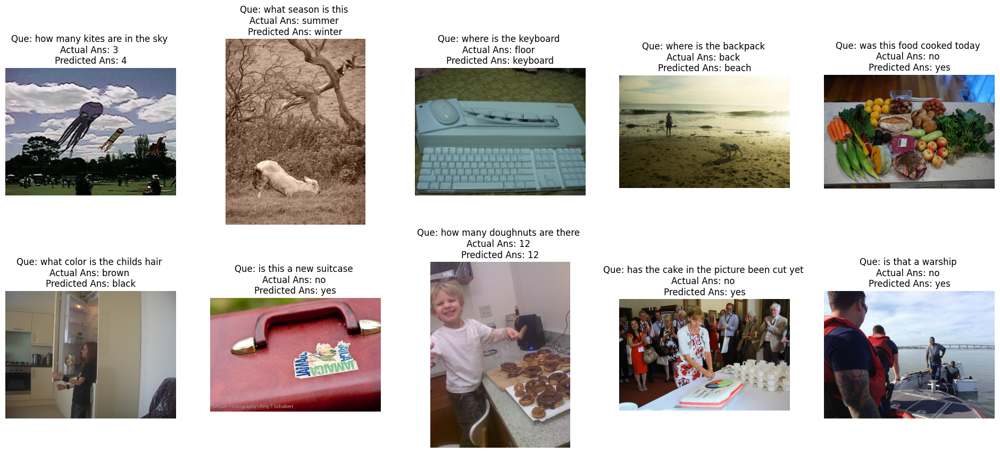

In [ ]:
test_image_path = list(X_test['image_id'])
test_question = list(X_test['question_preprocessed'])
test_answer = list(y_test)

# Plot test images, questions, actual answers and predicted answers
fig = plt.figure(figsize=(24, 10))
for a,i in enumerate(list(np.arange(5,15))):
  fig.add_subplot(2, 5, a+1)
  img = cv2.imread(colab_path+test_image_path[i])
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  plt.imshow(img); plt.axis('off')
  plt.title(f'Que: {test_question[i]} \nActual Ans: {labelencoder.inverse_transform(test_answer)[i]} \nPredicted Ans: {labelencoder.inverse_transform([np.argmax(model_lstm_vit.predict([np.array([test_que[i]]),np.array([test_image[i]])],verbose=0))])[0]}')

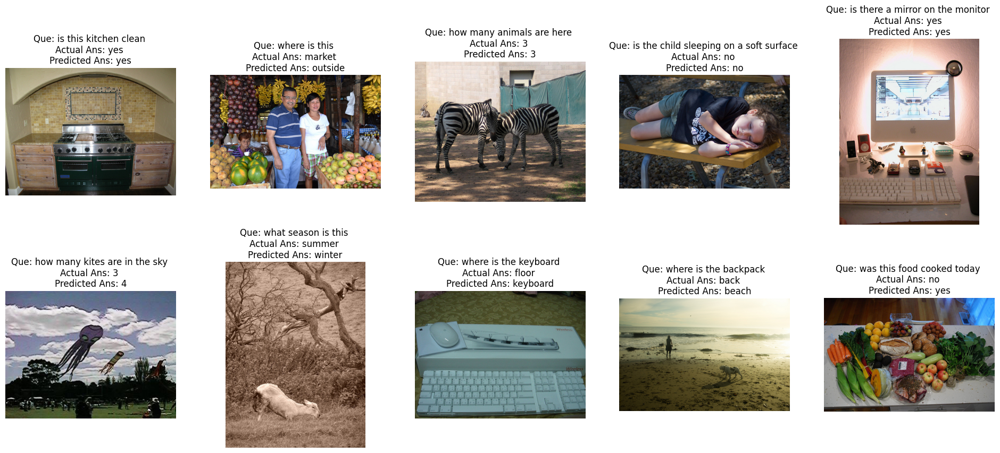

In [ ]:
test_image_path = list(X_test['image_id'])
test_question = list(X_test['question_preprocessed'])
test_answer = list(y_test)

# Plot test images, questions, actual answers and predicted answers
fig = plt.figure(figsize=(24, 10))
for a,i in enumerate(list(np.arange(10))):
  fig.add_subplot(2, 5, a+1)
  img = cv2.imread(colab_path+test_image_path[i])
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  plt.imshow(img); plt.axis('off')
  plt.title(f'Que: {test_question[i]} \nActual Ans: {labelencoder.inverse_transform(test_answer)[i]} \nPredicted Ans: {labelencoder.inverse_transform([np.argmax(model_lstm_vit.predict([np.array([test_que[i]]),np.array([test_image[i]])],verbose=0))])[0]}')

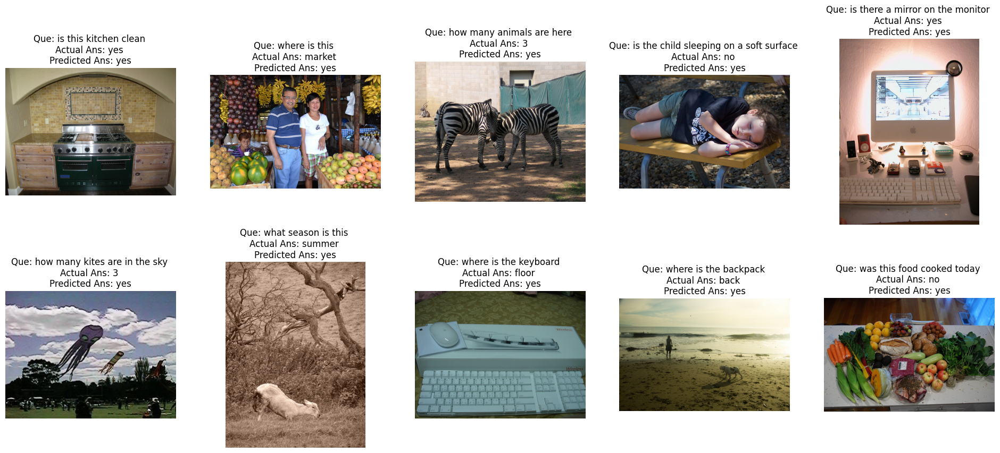

In [ ]:
test_image_path = list(X_test['image_id'])
test_question = list(X_test['question_preprocessed'])
test_answer = list(y_test)

# Plot test images, questions, actual answers and predicted answers
fig = plt.figure(figsize=(24, 10))
for a,i in enumerate(list(np.arange(10))):
  fig.add_subplot(2, 5, a+1)
  img = cv2.imread(colab_path+test_image_path[i])
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  plt.imshow(img); plt.axis('off')
  plt.title(f'Que: {test_question[i]} \nActual Ans: {labelencoder.inverse_transform(test_answer)[i]} \nPredicted Ans: {labelencoder.inverse_transform([np.argmax(model_lstm_vit.predict([np.array([test_que[i]]),np.array([test_image[i]])],verbose=0))])[0]}')

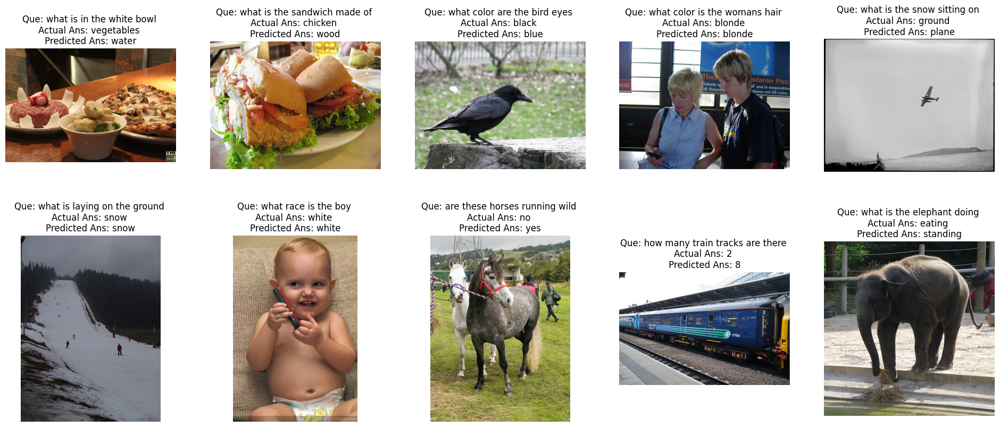

In [ ]:
test_image_path = list(X_test['image_id'])
test_question = list(X_test['question_preprocessed'])
test_answer = list(y_test)

# Plot test images, questions, actual answers and predicted answers
fig = plt.figure(figsize=(24, 10))
for a,i in enumerate(list(np.arange(15,25))):
  fig.add_subplot(2, 5, a+1)
  img = cv2.imread(colab_path+test_image_path[i])
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  plt.imshow(img); plt.axis('off')
  plt.title(f'Que: {test_question[i]} \nActual Ans: {labelencoder.inverse_transform(test_answer)[i]} \nPredicted Ans: {labelencoder.inverse_transform([np.argmax(model_lstm_vit.predict([np.array([test_que[i]]),np.array([test_image[i]])],verbose=0))])[0]}')

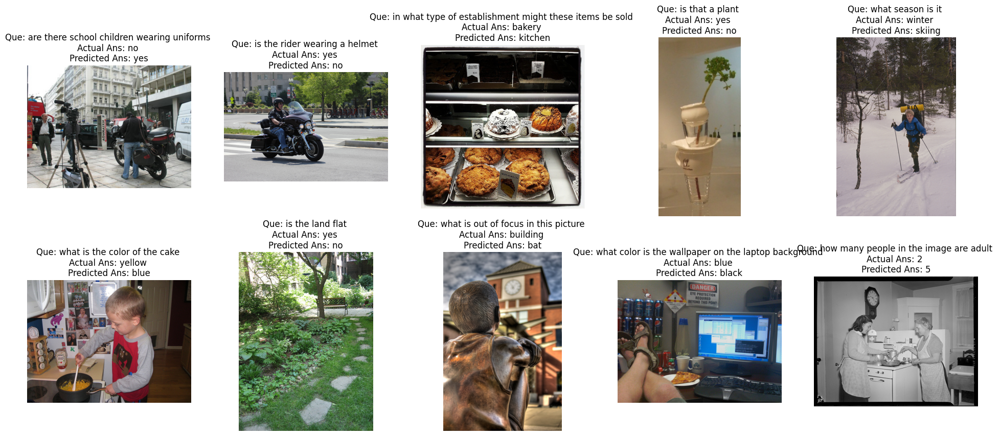

In [ ]:
test_image_path = list(X_test['image_id'])
test_question = list(X_test['question_preprocessed'])
test_answer = list(y_test)

# Plot test images, questions, actual answers and predicted answers
fig = plt.figure(figsize=(24, 10))
for a,i in enumerate(list(np.arange(5,15))):
  fig.add_subplot(2, 5, a+1)
  img = cv2.imread(colab_path+test_image_path[i])
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  plt.imshow(img); plt.axis('off')
  plt.title(f'Que: {test_question[i]} \nActual Ans: {labelencoder.inverse_transform(test_answer)[i]} \nPredicted Ans: {labelencoder.inverse_transform([np.argmax(model_lstm_vit.predict([np.array([test_que[i]]),np.array([test_image[i]])],verbose=0))])[0]}')

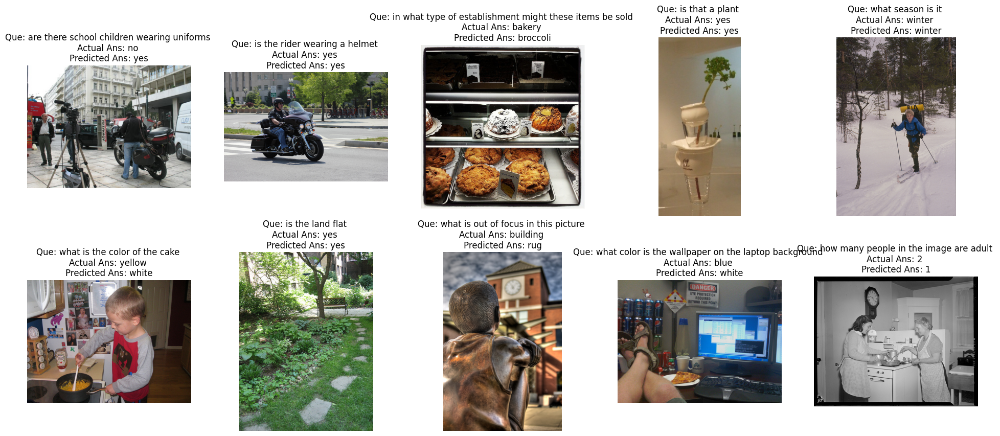

In [ ]:
test_image_path = list(X_test['image_id'])
test_question = list(X_test['question_preprocessed'])
test_answer = list(y_test)

# Plot test images, questions, actual answers and predicted answers
fig = plt.figure(figsize=(24, 10))
for a,i in enumerate(list(np.arange(5,15))):
  fig.add_subplot(2, 5, a+1)
  img = cv2.imread(colab_path+test_image_path[i])
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  plt.imshow(img); plt.axis('off')
  plt.title(f'Que: {test_question[i]} \nActual Ans: {labelencoder.inverse_transform(test_answer)[i]} \nPredicted Ans: {labelencoder.inverse_transform([np.argmax(model_lstm_efinet.predict([np.array([test_que[i]]),np.array([test_image[i]])],verbose=0))])[0]}')

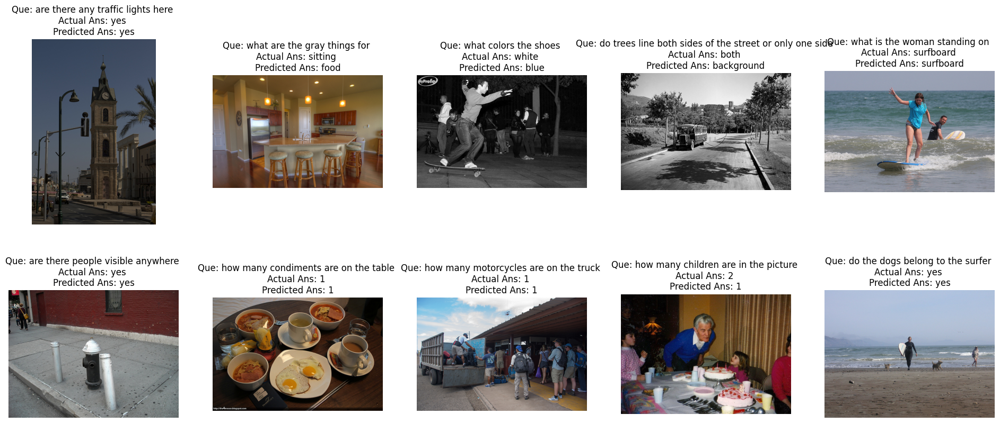

In [ ]:
test_image_path = list(X_test['image_id'])
test_question = list(X_test['question_preprocessed'])
test_answer = list(y_test)

# Plot test images, questions, actual answers and predicted answers
fig = plt.figure(figsize=(24, 10))
for a,i in enumerate(list(np.arange(20,30))):
  fig.add_subplot(2, 5, a+1)
  img = cv2.imread(colab_path+test_image_path[i])
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  plt.imshow(img); plt.axis('off')
  plt.title(f'Que: {test_question[i]} \nActual Ans: {labelencoder.inverse_transform(test_answer)[i]} \nPredicted Ans: {labelencoder.inverse_transform([np.argmax(model_lstm_efinet.predict([np.array([test_que[i]]),np.array([test_image[i]])],verbose=0))])[0]}')

## 2. Results

In [ ]:
!pip install prettytable

In [ ]:
from prettytable import PrettyTable
x2 = PrettyTable(["Model", "Datapoints", "Class Labels", "Sampled Datapoints", "Epochs", "Train Accuracy", "Validation Accuracy", "Test Accuracy"])
x2.add_row(["LSTM+VGG19", "380554", "1000", "50000", "50", round(Train_accuracy,3), round(Val_accuracy,3), round(Test_accuracy,3)])
print(x2)

NameError: name 'Train_accuracy' is not defined